In [1]:
import xarray as xr
import os, os.path
import glob
import sys
import scipy
import scipy.stats as sp
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import matplotlib.ticker as ticker
import shapefile
import pyproj
from scipy.optimize import curve_fit
import cartopy

plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['legend.fontsize']=12
plt.rcParams['lines.linewidth']=3
plt.rcParams['axes.linewidth']=1
plt.rcParams['axes.titlesize']=18

In [2]:
# Leo's common python files
sys.path.insert(0,'../')

# IPython extension to reload modules before executing user code.
# https://ipython.org/ipython-doc/3/config/extensions/autoreload.html
%load_ext autoreload

%aimport libracmo 
%aimport libtimeseries 
%aimport libplot

# Reload all modules imported with %aimport every time before executing the Python code typed.
%autoreload 1

%matplotlib inline

In [3]:
#SET THE MODELNAME HERE
modelname = 'ERA5-3H'
mask = "IS"
#SET THE MODELNAME HERE
modelnames = ['ERA5-3H','CESM2_hist_r567','CESM2_SSP126_r567','CESM2_SSP585_r567']
modelname1 = 'ERA5-3H'
modelname2 = 'CESM2_hist_r567'
modelname3 = 'CESM2_SSP126_r567'
modelname4 = 'CESM2_SSP245_r567'
modelname5 = 'CESM2_SSP585_r567'
mask = "IS"


In [4]:
time = {}
ds1 = {}
ds2 = {}
t2m = {}
precip = {}
snowmelt = {}
subl = {}
runoff = {}

time['CESM2_hist_r567'] = pd.date_range(start='1950', end='2014-12', freq='YS')
time['CESM2_SSP126_r567'] = pd.date_range(start='2015', end='2099-12', freq='YS')
time['CESM2_SSP245_r567'] = pd.date_range(start='2015', end='2099-12', freq='YS')
time['CESM2_SSP585_r567'] = pd.date_range(start='2015', end='2099-12', freq='YS')
time['ERA5-3H'] = pd.date_range(start='1979', end='2021', freq='YS')

with xr.open_dataset("~/Dropbox/RACMO_data/RACMO2.3p2_CESM2_hist_r567_ANT27/Yearly/int_IMBIE2/SMB_int_CESM2_hist_r567_Yearly_IceShelves_1950_2014.nc") as ds:
     ds1['CESM2_hist_r567'] = ds.assign_coords(time=("time",time['CESM2_hist_r567'])) 

with xr.open_dataset("~/Dropbox/RACMO_data/RACMO2.3p2_CESM2_SSP126_r567_ANT27/Yearly/int_IMBIE2/SMB_int_CESM2_SSP126_r567_Yearly_IceShelves_2015_2099.nc") as ds:
     ds1['CESM2_SSP126_r567'] = ds.assign_coords(time=("time",time['CESM2_SSP126_r567'])) 

with xr.open_dataset("~/Dropbox/RACMO_data/RACMO2.3p2_CESM2_SSP245_r567_ANT27/Yearly/int_IMBIE2/SMB_int_CESM2_SSP245_r567_Yearly_IceShelves_2015_2099.nc") as ds:
     ds1['CESM2_SSP245_r567'] = ds.assign_coords(time=("time",time['CESM2_SSP245_r567']))        
        
with xr.open_dataset("~/Dropbox/RACMO_data/RACMO2.3p2_CESM2_SSP585_r567_ANT27/Yearly/int_IMBIE2/SMB_int_CESM2_SSP585_r567_Yearly_IceShelves_2015_2099.nc") as ds:
     ds1['CESM2_SSP585_r567'] = ds.assign_coords(time=("time",time['CESM2_SSP585_r567'])) 
        
with xr.open_dataset("/Users/wessem/Dropbox/RACMO_data/RACMO2.3p2_ERA5-3H_ANT27/Yearly/int_IMBIE2/SMB_int_ERA5-3H_Yearly_IceShelves_1979_2021.nc") as ds:
     ds1['ERA5-3H'] = ds.assign_coords(time=("time",time['ERA5-3H']))        

In [5]:
area = ds1[modelname].area_IS#CHECK THIS WE FIXED THIS HARD FIX TO SOLVE FOR THE INDRECT FILE CREATED BY NCL

snowmelt1 = ds1[modelname1].snowmelt_IS
precip1   = ds1[modelname1].precip_IS
t2m1      = ds1[modelname1].t2m_IS-273.15
snowfall1 = ds1[modelname1].snowfall_IS
subl1     = ds1[modelname1].subl_IS

rainfall1 = precip1-snowfall1
snowmelt1 = snowmelt1+rainfall1
accu1     = snowfall1+subl1

snowmelt2 = ds1[modelname2].snowmelt_IS
precip2   = ds1[modelname2].precip_IS
t2m2      = ds1[modelname2].t2m_IS-273.15
snowfall2 = ds1[modelname2].snowfall_IS
subl2     = ds1[modelname2].subl_IS

rainfall2 = precip2-snowfall2
snowmelt2 = snowmelt2+rainfall2

accu2   = snowfall2+subl2

snowmelt3 = ds1[modelname3].snowmelt_IS
precip3   = ds1[modelname3].precip_IS
t2m3      = ds1[modelname3].t2m_IS-273.15
snowfall3 = ds1[modelname3].snowfall_IS
subl3     = ds1[modelname3].subl_IS

rainfall3 = precip3-snowfall3
snowmelt3 = snowmelt3+rainfall3
accu3     = snowfall3+subl3

snowmelt4 = ds1[modelname4].snowmelt_IS
precip4   = ds1[modelname4].precip_IS
t2m4      = ds1[modelname4].t2m_IS-273.15
snowfall4 = ds1[modelname4].snowfall_IS
subl4     = ds1[modelname4].subl_IS

rainfall4 = precip4-snowfall4
snowmelt4 = snowmelt4+rainfall4

accu4     = snowfall4+subl4

snowmelt5 = ds1[modelname5].snowmelt_IS
precip5   = ds1[modelname5].precip_IS
t2m5      = ds1[modelname5].t2m_IS-273.15
snowfall5 = ds1[modelname5].snowfall_IS
subl5     = ds1[modelname5].subl_IS

rainfall5 = precip5-snowfall5
snowmelt5 = snowmelt5+rainfall5

accu5 = snowfall5+subl5


#snowmelt[modelname].values = np.where(snowmelt[modelname] < 0.01,0.01,snowmelt[modelname])

area  = ds1['ERA5-3H'].area_IS

snowfall_total  = np.concatenate([snowfall1,snowfall2,snowfall3,snowfall4,snowfall5])
snowmelt_total  = np.concatenate([snowmelt1,snowmelt2,snowmelt3,snowmelt4,snowmelt5])
precip_total    = np.concatenate([precip1,precip2,precip3,precip4,precip5])
t2m_total       = np.concatenate([t2m1,t2m2,t2m3,t2m4,t2m5])
subl_total      = np.concatenate([subl1,subl2,subl3,subl4,subl5])
accu_total      = np.concatenate([accu1,accu2,accu3,accu4,accu5])

rainfall_total = precip_total-snowfall_total



In [6]:
sf = shapefile.Reader("../../BASINS/ANT_Basins_IMBIE2_v1.6/IceShelves_Y2015-2017_Antarctica_v2.2.1.shp")
rec = sf.records()


In [7]:
def monoExp(x, A, B):
    return A*np.exp(B*x)

def power_law(x, a, b):
    return a*np.power(x, b)

def monoLin(x,A,B):
    return A*x+B

from shapely.geometry import LineString

def find_intersect(x,y,y2):
    popt, pcov = curve_fit(monoExp, x, y,bounds=(0,[25000,1]),maxfev=3000)
    popt2, pcov = curve_fit(monoLin, x, y2,bounds=(0,[10000,10000]),maxfev=3000)
    x = np.arange(x.min(),0)
               
    f = monoExp(x,*popt)
    g = monoLin(x,*popt2)
    
    first_line  = LineString(np.column_stack((x, f)))
    second_line = LineString(np.column_stack((x, g)))
    MX = first_line.intersection(second_line)
    return  MX
    
def truncate(n, decimals=0):
    multiplier = 10 ** decimals
    return int(n * multiplier) / multiplier



0

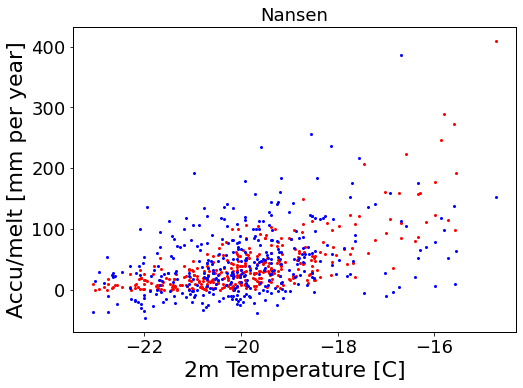

In [84]:
#PLOT A SPECIFIC ICE SHELF

plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['legend.fontsize']=12
plt.rcParams['lines.linewidth']=3
plt.rcParams['axes.linewidth']=1
plt.rcParams['axes.titlesize']=18
count=1    #df[df.y == 'N/A']['y'] = np.nan
f = plt.figure(figsize=(20,20))
    
#IS_names = ["Getz","LarsenC","Baudouin","Amery","Shackleton","Conger_Glenzer","Pine_Island","George_VI","Venable","Holmes"]
IS_names = ["Nansen"]

for k in np.arange(0,len(sf.records())):
    record=rec[k]
    strrecord = record[0]
    if strrecord in IS_names:
    #if area[k]*1E6>30000:

            x  = t2m_total[:,k]
            y  = snowmelt_total[:,k]/area[k].values+rainfall_total[:,k]/area[k].values
            z  = accu_total[:,k]/area[k].values#-runoff_total[:,k]/area[k].values
            T_era5 = t2m1[:,k]
            r = rainfall1[:,k]/area[k].values
            
            if strrecord=="Holmes":
                print(z.min(),z.max())
                
            fig  = plt.subplot(4,3,count)
            axs=plt.plot(x, y, 'r.', label=strrecord,markersize=4)
            axs=plt.plot(x, z, 'b.',markersize=4)
            fig.set_ylabel('Accu/melt [mm per year]',fontsize=22)
            fig.set_xlabel('2m Temperature [C]',fontsize=22)
        
            xx = np.arange(x.min(),0)
            #fig.set_ylim(0,1000)
            #fig.set_xlim(-35,-5)
            fig.title.set_text(strrecord)
            popt, pcov = curve_fit(monoExp, x, y,bounds=(0,[25000,1]),maxfev=15000)
            #axs=plt.plot(xx, monoExp(xx, *popt), 'k-')
            popt2, pcov = curve_fit(monoLin, x, z,bounds=(0,[10000,10000]),maxfev=15000)
            #axs=plt.plot(xx, monoLin(xx, *popt2), 'k-')
            #popt3, pcov = curve_fit(power_law, z,x,bounds=(-np.inf,[np.inf, np.inf]),maxfev=30000)
            #axs=plt.plot(xx, power_law(xx, *popt3), 'r-')
            MX = find_intersect(x,y,z*0.7)
          
            #popt, pcov = curve_fit(monoExp, xx, yy,bounds=(0,[25000,1]))
            #axs=plt.plot(xx, monoExp(xx, *popt), 'k-')
            #popt2, pcov = curve_fit(monoLin, xx, yy2,bounds=(-1000,[10000,10000]))
            #axs=plt.plot(xx, monoLin(xx, *popt2), 'k-')
            count=count+1
    
plt.tight_layout()
f.savefig("../plots/basin_scatter_IceShelves_"+modelname+"_"+mask+".pdf")
os.system("pdfcrop ../plots/basin_scatter_IceShelves_"+modelname+"_"+mask+".pdf ../plots/basin_scatter_IceShelves_"+modelname+"_"+mask+".pdf")

In [85]:
t2m_mean=t2m1.mean(dim='time')
accu_mean=accu1.mean(dim='time')/area.values
melt_mean=snowmelt1.mean(dim='time')/area.values

DC = np.where(np.logical_and(accu_mean<500,t2m_mean<-15))[0]
WW = np.where(np.logical_and(accu_mean>500,t2m_mean>-15))[0]

# set varnames
regions  = [DC,WW]  # DRY AND COLD VS WARM AND WET
regionName = ["Dry (A<500mm) and cold (T<-15\N{DEGREE SIGN}C)","Wet (A>500mm) and warm (T>-15\N{DEGREE SIGN}C)"]


present-day accumulations =178.64817138293694
present-day snowmelt =16.68956673759116
present-day accumulations =796.8315300062662
present-day snowmelt =140.0277148301104
dt MELT = [0.04565030744507781, 0.050629268574917924]
dt ACCU = [0.23031875369076601, 0.2232708284137553]


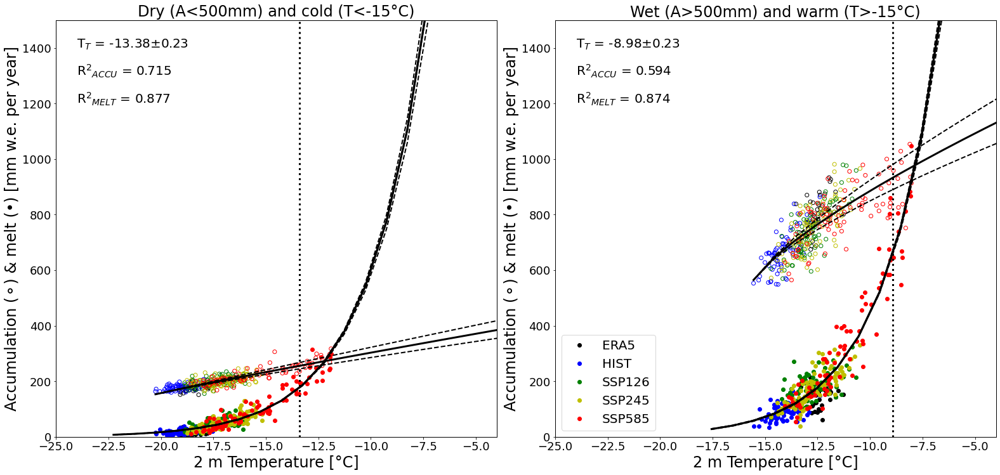

In [88]:
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['legend.fontsize']=12
plt.rcParams['lines.linewidth']=3
plt.rcParams['axes.linewidth']=1
plt.rcParams['axes.titlesize']=18

dT_MELT=[]
dT_MELT= [0 for i in range(2)] 
dT_ACCU = dT_MELT.copy()
dT = dT_MELT.copy()
TT = dT.copy()
TT_var = dT.copy()
 
count = 1    #df[df.y == 'N/A']['y'] = np.nan
f = plt.figure(figsize=(20,20))
f.set_figheight(20)
f.set_figwidth(22)
style = dict(size=20, color='black')
j=-1
def truncate(n):
    return int(n * 1000) / 1000
for reg in regions:
    j=j+1
    x1 = t2m1[:,reg].mean(dim="basins")
    y1 = snowmelt1[:,reg].mean(dim="basins")/area[reg].mean()
    
    z1 = accu1[:,reg].mean(dim="basins")/area[reg].mean()
    x2 = t2m2[:,reg].mean(dim="basins")
    y2 = snowmelt2[:,reg].mean(dim="basins")/area[reg].mean()
    z2 = accu2[:,reg].mean(dim="basins")/area[reg].mean()
    x3 = t2m3[:,reg].mean(dim="basins")
    y3 = snowmelt3[:,reg].mean(dim="basins")/area[reg].mean()
    z3 = accu3[:,reg].mean(dim="basins")/area[reg].mean()
    x4 = t2m4[:,reg].mean(dim="basins")
    y4 = snowmelt4[:,reg].mean(dim="basins")/area[reg].mean()
    z4 = accu4[:,reg].mean(dim="basins")/area[reg].mean()
    x5 = t2m5[:,reg].mean(dim="basins")
    y5 = snowmelt5[:,reg].mean(dim="basins")/area[reg].mean()
    z5 = accu5[:,reg].mean(dim="basins")/area[reg].mean()
                
    x = np.concatenate([x1,x2,x3,x4,x5])
    y = np.concatenate([y1,y2,y3,y4,y5])
    z = np.concatenate([z1,z2,z3,z4,z5])
    x_ind = x.argsort()
    x = x[x_ind]
    y = y[x_ind]
    z = z[x_ind]
    fig  = plt.subplot(2,2,count)
    plt.title(regionName[count-1],fontsize=24)
    fig.set_ylabel('Accumulation (\u26AC) & melt (\u2022) [mm w.e. per year]',fontsize=24)
    fig.set_xlabel('2 m Temperature [\N{DEGREE SIGN}C]',fontsize=24)
    
    axs=plt.plot(x1, y1, 'k.',markersize=12,label="ERA5",)
    axs=plt.scatter(x1, z1,edgecolor='k',facecolors='none')
    axs=plt.plot(x2, y2, 'b.',markersize=12,label="HIST")
    axs=plt.scatter(x2, z2,edgecolor='b',facecolors='none')
    axs=plt.plot(x3, y3, 'g.',markersize=12,label="SSP126")
    axs=plt.scatter(x3, z3,edgecolor='g',facecolors='none')
    axs=plt.plot(x4, y4, 'y.',markersize=12,label="SSP245")
    axs=plt.scatter(x4, z4,edgecolor='y',facecolors='none')
    axs=plt.plot(x5, y5, '.r',markersize=12,label="SSP585")
    axs=plt.scatter(x5, z5,edgecolor='r',facecolors='none')
    
    xx = np.arange(x.min(),0)
    
    popt, pcov = curve_fit(monoExp, x,y,bounds=([0,0],[30000,1]),maxfev=200000)
    axs = plt.plot(xx, monoExp(xx, *popt), 'k-')
    popt2, pcov2 = curve_fit(monoLin, x, z,bounds=(0,[10000,10000]),maxfev=20000)
    # axs=plt.plot(x, monoLin(x, *popt2), 'k-')
    #fit_y = monoLin(x,popt2*)
    x_new = x-x.min()+0.1
    z_new = z-z.min()+0.1
    xx_new = np.arange(x_new.min(),x_new.max()+10)

    popt3, pcov3 = curve_fit(f=power_law, xdata=x_new, ydata=z_new, p0=[0, 0], bounds=(-np.inf, np.inf),maxfev=10000)# Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
    #axs = plt.plot(xx_new+x.min()-0.1, power_law(xx_new, *popt3)+z.min()-0.1, 'r-')
   
    xx = np.arange(x.min()-2,0)
    ff = monoExp(xx,*popt)
    gg = 0.7*monoLin(xx,*popt2)
    gg2 = 0.7*(power_law(xx_new, *popt3)+z.min()-0.1)
       
    first_line = LineString(np.column_stack((xx, ff)))
    second_line = LineString(np.column_stack((xx, gg)))
    second_line2 = LineString(np.column_stack((xx_new+x.min()-0.1, gg2)))
    
    intersection = first_line.intersection(second_line)
    intersection2 = first_line.intersection(second_line2)
       
    intersection = first_line.intersection(second_line)
    intersection2 = first_line.intersection(second_line2)

    squaredDiffs = np.square(y - monoExp(x,*popt))
    squaredDiffsFromMean = np.square(y - np.mean(y))
    rSquared_MELT = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
    #print("ME "f"R² = {rSquared_MELT}")   
    squaredDiffs = np.square(z - monoLin(x,*popt2))
    squaredDiffsFromMean = np.square(z- np.mean(z))
    rSquared_ACCU = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
    #print("LI "f"R² = {rSquared_ACCU}")   
    squaredDiffs = np.square(z_new - power_law(x_new,*popt3))
    squaredDiffsFromMean = np.square(z_new- np.mean(z_new))
    rSquared_ACCU2 = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
     
    fit_A = popt[0]
    fit_B = popt[1]
    
    SE = np.sqrt(np.diag(pcov))
    
    SE_A = SE[0]
    SE_B = SE[1]
  
         
    axs=plt.plot(xx, monoExp(xx, fit_A+SE_A,fit_B+SE_B), 'k--',linewidth=2)
    axs=plt.plot(xx, monoExp(xx, fit_A-SE_A,fit_B-SE_B), 'k--',linewidth=2)
    axs=plt.plot(xx, monoExp(xx, fit_A,fit_B), 'k-')
    
    ee1 = monoExp(xx, fit_A+SE_A,fit_B+SE_B) #error lines of expfit
    ee11 = monoExp(xx, fit_A-SE_A,fit_B-SE_B)#error lines of expfit

    first_lineP = LineString(np.column_stack((xx, ee1)))
    first_lineM = LineString(np.column_stack((xx, ee11)))

    intersectionP_melt = first_lineP.intersection(second_line2)
    intersectionM_melt = first_lineM.intersection(second_line2)
    MX   = intersection2.x
    dMXM = intersectionM_melt.x
    dMXP = intersectionP_melt.x
    
    DP = abs(MX-dMXP)
    DM = abs(MX-dMXM)
    dT_MELT[j] = np.sqrt(DP**2+DM**2)

    fit_A = popt3[0]
    fit_B = popt3[1]
    
    SE = np.sqrt(np.diag(pcov3))
    
    SE_A = SE[0]
    SE_B = SE[1]
    A  = fit_A
    AP = fit_A+SE_A
    AM = fit_A-SE_A
 
    axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, fit_A+SE_A,fit_B+SE_B)+z.min()-0.1, 'k--',linewidth=2)
    axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, fit_A-SE_A,fit_B-SE_B)+z.min()-0.1, 'k--',linewidth=2)
    
    axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, fit_A,fit_B)+z.min()-0.1, 'k-')
    
    ee2 = 0.7*(power_law(xx_new, fit_A+SE_A,fit_B+SE_B)+z.min()-0.1) #error lines of power law fit
    ee22 = 0.7*(power_law(xx_new, fit_A-SE_A,fit_B-SE_B)+z.min()-0.1)#error lines of power law fit

    first_line = LineString(np.column_stack((xx, ff)))
    second_lineP = LineString(np.column_stack((xx_new+x.min()-0.1, ee2)))
    second_lineM = LineString(np.column_stack((xx_new+x.min()-0.1, ee22)))

    intersectionP_accu = first_line.intersection(second_lineP)
    intersectionM_accu = first_line.intersection(second_lineM)
  
    MX   = intersection2.x
    dMXM = intersectionM_accu.x
    dMXP = intersectionP_accu.x
    
    DP = abs(MX-dMXP)
    DM = abs(MX-dMXM)
    dT_ACCU[j] = np.sqrt(DP**2+DM**2)
    dT[j] = np.sqrt(dT_ACCU[j]**2+dT_MELT[j]**2)

    fig.axvline(*intersection.xy[0],ls='dotted',c='k')
    if count==1:
         fig.set_ylim(0,1500)
         fig.set_xlim(-25,-4)
         fig.text(-24,1300, "R$^2$$_{ACCU}$ = "+str(truncate(rSquared_ACCU2)), **style)
         fig.text(-24,1200, "R$^2$$_{MELT}$ = "+str(truncate(rSquared_MELT )), **style)
         fig.text(-24,1400, F'T$_T$ = {MX:.2f}\u00B1{dT[j]:.2}', **style)

         print("present-day accumulations ="+str(z1.mean().values))
         print("present-day snowmelt ="+str(y1.mean().values))

    elif count==2:
         fig.set_ylim(0,1500)
         fig.set_xlim(-25,-4)
         fig.text(-24,1300, "R$^2$$_{ACCU}$ = "+str(truncate(rSquared_ACCU2)), **style)
         fig.text(-24,1200, "R$^2$$_{MELT}$ = "+str(truncate(rSquared_MELT)), **style)
         fig.text(-24,1400, F'T$_T$ = {MX:.2f}\u00B1{dT[j]:.2f}', **style)
         print("present-day accumulations ="+str(z1.mean().values))
         print("present-day snowmelt ="+str(y1.mean().values))
         
        
   #export data for ncl code
   # AP = xr.DataArray(AP,name="dAP")
   # AP = AP.to_netcdf("AP_Fig1.nc")
   # AM = xr.DataArray(AM,name="dAM")
   # AM = AM.to_netcdf("AM_Fig1.nc")
   # 
   # M = xr.DataArray(M,name="M")
   # M = M.to_netcdf("M_Fig1.nc")
   # MP = xr.DataArray(MP,name="dMP")
   # MP = MP.to_netcdf("MP_Fig1.nc")
   # MM = xr.DataArray(MM,name="dMM")
   # MM = MM.to_netcdf("MM_Fig1.nc")
   # 
   # xx = xr.DataArray(xx,name="xx")
   # xx.to_netcdf("xx_Fig1.nc")
   # xx_new = xr.DataArray(xx_new,name="xx_new")
   # xx_new.to_netcdf("xx_new_Fig1.nc")
    count=count+1



leg = plt.legend(loc='lower left',fontsize=20)
   
plt.tight_layout()
f.savefig("../plots/ANT_scatter_IS_regional_seperate_"+mask+"_paper9.pdf")


print("dt MELT =",dT_MELT)
print("dt ACCU =",dT_ACCU)

In [91]:
#sort arrays for listing from dry to wet
accu_avg = accu1.mean('time')/area.values
accu_ind = accu_avg.argsort()
np.shape(accu_ind)

(236,)

In [92]:
#basinnames = [2,3]
count=1    #df[df.y == 'N/A']['y'] = np.nan
f = plt.figure(figsize=(225,225))
plt.rcParams["xtick.labelsize"] = 180
plt.rcParams["ytick.labelsize"] = 180
plt.rcParams['axes.labelsize'] = 160
plt.rcParams['legend.fontsize']=120
plt.rcParams['lines.linewidth']=20
plt.rcParams['axes.linewidth']=10
plt.rcParams['axes.titlesize']=140
style = dict(size=120, color='black')

T=[]
T = [0 for i in range(56)] 
accu = T.copy()
melt = T.copy()
T2m = T.copy()
Thist = T.copy()

dT_MELT = T.copy()
dT_ACCU = T.copy()
dT = T.copy()
TT_var  = T.copy()
iceshelfnames = T.copy()
j = -1
for kk in np.arange(0,len(sf.records())):
      #if area[k]*1E6>10000:
    k = int(accu_ind[kk])
    
    record=rec[k]
    strrecord = record[0]
    if area[k]*1E6>800:#strrecord in IS_names:
        j=j+1
        iceshelfnames[j]=strrecord
        x1  = t2m1[:,k]
        y1  = snowmelt1[:,k]/area[k].values+rainfall1[:,k]/area[k].values
        z1  = accu1[:,k]/area[k]
        
        x2  = t2m2[:,k]
        y2  = snowmelt2[:,k]/area[k].values+rainfall2[:,k]/area[k].values
        z2  = accu2[:,k]/area[k].values
        
        x3  = t2m3[:,k]
        y3  = snowmelt3[:,k]/area[k].values+rainfall3[:,k]/area[k].values
        z3  = accu3[:,k]/area[k].values

        x4  = t2m4[:,k]
        y4  = snowmelt4[:,k]/area[k].values+rainfall4[:,k]/area[k].values
        z4  = accu4[:,k]/area[k].values

        x5  = t2m5[:,k]
        y5  = snowmelt5[:,k]/area[k].values+rainfall5[:,k]/area[k].values
        z5  = accu5[:,k]/area[k].values

        
        x  = t2m_total[:,k]
        y  = snowmelt_total[:,k]/area[k].values+rainfall_total[:,k]/area[k].values
        z  = accu_total[:,k]/area[k].values
        
        x_ind = x.argsort()
        x = x[x_ind]
        y = y[x_ind]
        z = z[x_ind]
                
        fig  = plt.subplot(10,6,count)
        
        axs=plt.plot(x1, y1, 'k.',markersize=40,label="ERA5")
        axs=plt.plot(x1, z1, 'k.',markersize=40)
        axs=plt.plot(x2, y2, 'b.',markersize=40,label="HIST")
        axs=plt.plot(x2, z2, 'b.',markersize=40)
        axs=plt.plot(x3, y3, 'g.',markersize=40,label="SSP126")
        axs=plt.plot(x3, z3, 'g.',markersize=40)
        axs=plt.plot(x4, y4, 'y.',markersize=40,label="SSP245")
        axs=plt.plot(x4, z4, 'y.',markersize=40)
        axs=plt.plot(x5, y5, 'r.',markersize=40,label="SSP585")
        axs=plt.plot(x5, z5, 'r.',markersize=40)
        #axs=plt.plot(x, y, 'r.',markersize=10,label="MELT")
        #axs=plt.plot(x, z, 'b.',markersize=10,label="ACCUMULATION")
        
        fig.set_ylabel('A;M',fontsize=150)
        fig.set_xlabel('T2m',fontsize=150)
        fig.set_xlim(-35,0)
        fig.set_title(strrecord)

        xx = np.arange(x.min(),0)

        popt, pcov = curve_fit(monoExp, x,y,bounds=([0,0],[20000,1]),maxfev=10000)
        axs=plt.plot(x, monoExp(x, *popt), 'k-')
        
        
        popt2, pcov2 = curve_fit(monoLin, x, z,bounds=(0,[10000,10000]),maxfev=10000)
        # axs=plt.plot(x, monoLin(x, *popt2), 'k-')
        #fit_y = monoLin(x,popt2*)
        x_new = x-x.min()+0.1
        z_new = z-z.min()+0.1
        xx_new = np.arange(x_new.min(),x_new.max()+10)

        popt3, pcov3 = curve_fit(f=power_law, xdata=x_new, ydata=z_new, p0=[0, 0], bounds=(-np.inf, np.inf),maxfev=10000)# Get the standard deviations of the parameters (square roots of the # diagonal of the covariance)
        xx = np.arange(x.min()-2,0)
        ff = monoExp(xx,*popt)
        gg = 0.7*monoLin(xx,*popt2)
        gg2 = 0.7*(power_law(xx_new, *popt3)+z.min()-0.1)
    

        squaredDiffs = np.square(y - monoExp(x,*popt))
        squaredDiffsFromMean = np.square(y - np.mean(y))
        rSquared_MELT = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
        print("ME "f"R² = {rSquared_MELT}")   
        squaredDiffs = np.square(z - monoLin(x,*popt2))
        squaredDiffsFromMean = np.square(z- np.mean(z))
        rSquared_ACCU = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)
        print("LI "f"R² = {rSquared_ACCU}")   
        squaredDiffs = np.square(z_new - power_law(x_new,*popt3))
        squaredDiffsFromMean = np.square(z_new- np.mean(z_new))
        rSquared_ACCU2 = 1 - np.sum(squaredDiffs) / np.sum(squaredDiffsFromMean)

        Aexp = popt[0]
        Bexp = popt[1]

        SE_exp = np.sqrt(np.diag(pcov))
    
        SE_Aexp = SE_exp[0]
        SE_Bexp = SE_exp[1]
        
        axs=plt.plot(xx, monoExp(xx, Aexp+SE_Aexp,Bexp+SE_Bexp), 'k--',linewidth=10)
        axs=plt.plot(xx, monoExp(xx, Aexp-SE_Aexp,Bexp-SE_Bexp), 'k--',linewidth=10)
        axs=plt.plot(xx, monoExp(xx, Aexp,Bexp), 'k-')
        
       #fit_A = popt2[0]
       #fit_B = popt2[1]

       #SE = np.sqrt(np.diag(pcov2))

       #SE_A = SE[0]
       #SE_B = SE[1]
     
        APL = popt3[0]
        BPL = popt3[1]
       
        SE_PL = np.sqrt(np.diag(pcov3))

        SE_APL = SE_PL[0]
        SE_BPL = SE_PL[1]
        
        axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, APL+SE_APL,BPL+SE_BPL)+z.min()-0.1, 'k--',linewidth=10)
        axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, APL-SE_APL,BPL-SE_BPL)+z.min()-0.1, 'k--',linewidth=10)
        axs=plt.plot(xx_new+x.min()-0.1, power_law(xx_new, APL,BPL)+z.min()-0.1, 'k-')
        
        first_line = LineString(np.column_stack((xx, ff)))
           #second_line = LineString(np.column_stack((xx, gg)))
        second_line2 = LineString(np.column_stack((xx_new+x.min()-0.1, gg2)))

           #intersection = first_line.intersection(second_line)
        intersection2 = first_line.intersection(second_line2)
        # NOW COMPUTE AND INTERSECT THE LINES
        print(strrecord)
        print(intersection2)
              
        if intersection2.geom_type == 'Point' or intersection2.geom_type == 'MultiPoint':

                     #intersection = first_line.intersection(second_line)
                     
            ee1 = monoExp(xx, Aexp+SE_Aexp,Bexp+SE_Bexp) #error lines of expfit
            ee11 = monoExp(xx, Aexp-SE_Aexp,Bexp-SE_Bexp)#error lines of expfit

            first_lineP = LineString(np.column_stack((xx, ee1)))
            first_lineM = LineString(np.column_stack((xx, ee11)))

            intersectionP_melt = first_lineP.intersection(second_line2) #higher error limit
            intersectionM_melt = first_lineM.intersection(second_line2) #lower error limit
            if intersection2.geom_type == 'Point':
                MX   = intersection2.x
            elif intersection2.geom_type == 'MultiPoint':
                MX   = intersection2[1].x                
                
            if intersectionP_melt.geom_type == 'Point':
                dMXP = intersectionP_melt.x
                DP = abs(MX-dMXP)

            elif intersectionP_melt.geom_type == 'MultiPoint':
                dMXP   = intersectionP_melt[1].x
                DP = abs(MX-dMXP)
            else:
                DP = 0
                
            if intersectionM_melt.geom_type == 'Point':
                dMXM = intersectionM_melt.x
                DM = abs(MX-dMXM)

            elif intersectionM_melt.geom_type == 'MultiPoint':
                dMXM   = intersectionM_melt[1].x
                DM = abs(MX-dMXM)
            else:
                DM = 0  
                
            dT_MELT[j] = np.sqrt(DP**2+DM**2)

            ee2 = 0.7*(power_law(xx_new, APL+SE_APL,BPL+SE_BPL)+z.min()-0.1) #error lines of power law fit
            ee22 = 0.7*(power_law(xx_new, APL-SE_APL,BPL-SE_BPL)+z.min()-0.1)#error lines of power law fit

            first_line = LineString(np.column_stack((xx, ff)))
            second_lineP = LineString(np.column_stack((xx_new+x.min()-0.1, ee2)))
            second_lineM = LineString(np.column_stack((xx_new+x.min()-0.1, ee22)))

            intersectionP_accu = first_line.intersection(second_lineP)
            intersectionM_accu = first_line.intersection(second_lineM)
           
            if intersectionP_accu.geom_type == 'Point':
                dMXP = intersectionP_accu.x
                DP = abs(MX-dMXP)

            elif intersectionP_accu.geom_type == 'MultiPoint':
                dMXP   = intersectionP_accu[1].x
                DP = abs(MX-dMXP)
            else:
                DP = 0
                
            if intersectionM_accu.geom_type == 'Point':
                dMXM = intersectionM_accu.x
                DM = abs(MX-dMXM)

            elif intersectionM_accu.geom_type == 'MultiPoint':
                dMXM   = intersectionM_accu[1].x
                DM = abs(MX-dMXM)
            else:
                DM = 0   
         
            dT_ACCU[j] = np.sqrt(DP**2+DM**2)
            
            T[j] = MX
            if strrecord == "Vigrid":
                print(DP)
                print(DM)
                print(intersectionM_accu)
                print(intersectionP_accu)
                print(intersectionM_melt)
                print(intersectionP_melt)
                print(dT_ACCU[j])
                print(dT_MELT[j])

        else: 
            dT_ACCU[j] = 0.1*z1.mean()
            dT_MELT[j] = 0.1*y1.mean()
            T[j] = x1.mean().values #WHEN THRESHOLD ALREADY PASSED USE ERA5 AVERAGE
            
        #print(f"R² = {rSquared_ACCU}") 
        
        DT = T[j]-x1.mean().values
        accu[j]=z1.mean()
        melt[j]=y1.mean()
        T2m[j]=x1.mean()
        Thist[j]=x1.mean()

        Thist[j]=x1.mean()

        dT[j]= np.sqrt(dT_ACCU[j]**2+dT_MELT[j]**2)
        #print(F'dT = {dT[j]:.5f} ')
                       
            
        count=count+1
        
        MOA_era5 = y1/z1
        MOA_era5b = y1.mean()/z1.mean()
              
        if MOA_era5.mean()>0.7 or MOA_era5.mean()<0: #VERY DRY ICE SHELVES HAVE <0 ACCUMULATION AND HAVE PASSED MOA=0.7
            #print("WE AR")
            T[j]  = x1.mean().values
            dT[j] = abs(0.1000*x1.mean().values)
            
        if accu_avg[k]<300:
            fig.set_ylim(0,750)
            fig.text(-34,680, F'T$_T$ = {T[j]:.1f}\u00B1{dT[j]:.1f}', **style)
            fig.text(-34,580, "R$^2$$_{M}$ = "+str(truncate(rSquared_MELT )), **style)
            fig.text(-34,480, "R$^2$$_{A}$ = "+str(truncate(rSquared_ACCU2)), **style)
            fig.text(-34,380, "R$^2$$_{A_{lin}}$ = "+str(truncate(rSquared_ACCU)), **style)

        elif accu_avg[k]>700:
            fig.set_ylim(0,2500)
            fig.text(-34,2250, F'T$_T$ = {T[j]:.1f}\u00B1{dT[j]:.1f}', **style)
            fig.text(-34,2000, "R$^2$$_{M}$ = "+str(truncate(rSquared_MELT )), **style)

            fig.text(-34,1750, "R$^2$$_{A}$ = "+str(truncate(rSquared_ACCU2)), **style)
            fig.text(-34,1500, "R$^2$$_{A_{lin}}$ = "+str(truncate(rSquared_ACCU)), **style)

        else:
            fig.set_ylim(0,2000)
            fig.text(-34,1800, F'T$_T$ = {T[j]:.1f}\u00B1{dT[j]:.1f}', **style)
            fig.text(-34,1600, "R$^2$$_{M}$ = "+str(truncate(rSquared_MELT )), **style)
            fig.text(-34,1400, "R$^2$$_{A}}$ = "+str(truncate(rSquared_ACCU2)), **style)
            fig.text(-34,1200, "R$^2$$_{A_{lin}}$ = "+str(truncate(rSquared_ACCU)), **style)
     
        
#
        #fig.text(-30, 1500,"MOA=0.7 for "+str(truncate(MX[0],1))+"C",fontsize=20,bbox=dict(edgecolor='black',facecolor='white', alpha=1))   
        #fig.text(-30, 1000,"MOA="+str(truncate(monoExp(-9,*popt)/monoLin(-9,*popt2),2))+" for -9C ",fontsize=20,bbox=dict(edgecolor='black',facecolor='white', alpha=1))   
        #d.write(str(k)+" "+str(truncate(MX[0],2))+" "+str(truncate(MY[0],2))+" \n")

        
leg = plt.legend(bbox_to_anchor=(1.1, 1.05),markerscale=4.0,fontsize=100)
plt.tight_layout()



f.savefig("../plots/basin_scatter_IceShelves_allmodels_raw2.png")


ME R² = 0.565013532404118
LI R² = 0.14311706092215992
Nansen
LINESTRING EMPTY
ME R² = 0.5116495339558627
LI R² = 0.132932161050474
Drygalski
POINT (-20.92513576442126 58.91301693012576)
ME R² = 0.4171831758033733
LI R² = 0.1451771185308104
Ross_West
POINT (-20.57097658177255 77.37509305541684)
ME R² = 0.5021315178460242
LI R² = 0.5446411947426792
Filchner
POINT (-17.71313316222606 145.3586091328193)
ME R² = 0.513880953440119
LI R² = 0.2658413859129335
Ross_East
POINT (-18.72898088106415 116.1995121518135)
ME R² = 0.8161928240208561
LI R² = 0.4228594861559283
Vigrid
MULTIPOINT (-18.08688767974066 51.8337853867154, -14.73136981762503 157.343048563467)
0.5581775917516953
0.4620283914821641
MULTIPOINT (-18.06077652591098 52.32354735373298, -15.1933982091072 134.03514207429)
MULTIPOINT (-18.10421694207433 51.50874369522762, -14.17319222587334 187.8166852209784)
MULTIPOINT (-17.99277750319245 56.51449884876035, -14.87283269058057 154.3670745407163)
MULTIPOINT (-18.18527905810309 46.940139809

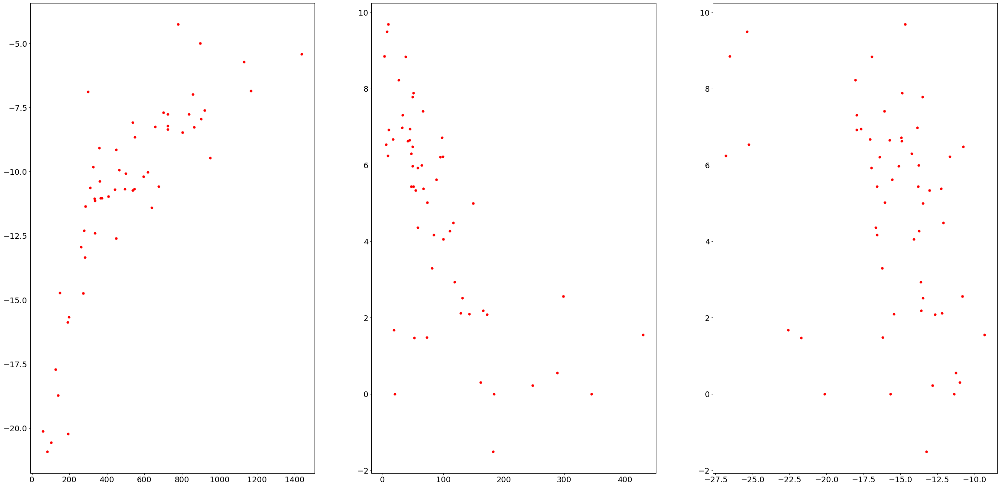

In [93]:
plt.rcParams["xtick.labelsize"] = 18
plt.rcParams["ytick.labelsize"] = 18
plt.rcParams['axes.labelsize'] = 16
plt.rcParams['legend.fontsize']=12
plt.rcParams['lines.linewidth']=3
plt.rcParams['axes.linewidth']=1
plt.rcParams['axes.titlesize']=18
f = plt.figure(figsize=(40,20))
ax = plt.subplot(131)

T = xr.DataArray(T,name="thresholdT")
dT = xr.DataArray(dT,name="dTT")
melt = xr.DataArray(melt,name="melt")
accu = xr.DataArray(accu,name="accu")
t2m = xr.DataArray(T2m,name="t2m")
Thist = xr.DataArray(Thist,name="Thist")

ax.plot(accu, T, 'r.',markersize=10)
ax = plt.subplot(132)
ax.plot(melt, T-T2m, 'r.',markersize=10)
ax = plt.subplot(133)
ax.plot(T2m, T-T2m, 'r.',markersize=10)

T.to_netcdf("thresholdT_ALL_IS_FINAL.nc")
dT.to_netcdf("dT_ALL_IS_FINAL.nc")
accu.to_netcdf("accu_era5_IS_FINAL.nc")
melt.to_netcdf("melt_era5_IS_FINAL.nc")
t2m.to_netcdf("t2m_era5_IS_FINAL.nc")
Thist.to_netcdf("t2m_hist_IS_FINAL.nc")